<a href="https://colab.research.google.com/github/ace26597/Acea-Smart-Water-Analytics/blob/main/acea_all.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as pl
from pylab import rcParams
import statsmodels.api as sm
import plotly.express as px
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit

import warnings
warnings.filterwarnings("ignore")

plt.style.use('seaborn-whitegrid')

# Import Data

#**Neccesity of saving water in italy**

In this notebook we suggest an approach to compute..........

# Problem definition

Since Acea Groups is an Italian multiutility operator, we are looking at datasets containing information about waterbodies in Italy. The distribution of datasets for the type of waterbody is different. There are four waterbody types: aquifer, water spring, lake and river. The datasets are not equally distributed over the waterbody types, as shown below. Since we are working with different waterbodies, we also have different features.

Let's check which are column categories the datasets have in common. As shown below, the columns Date, Rainfall and Temperature appear in all datasets. The columns Lake Level and Volume are waterbody unique columns. Additionally, for each waterbody a different feature has to be predicted. In below figure the target variable is marked with a lightblue box.

The goal is to create four mathematical models, one for each category of waterbody (acquifers, water springs, river, lake) to predict the amount of water in each unique waterbody for a set time interval. The predictive power of the models shall be evaluated with both Mean Absolute Error (MAE) and Root Mean Square Error (RMSE).

# Summary


In this notebook, we will learn how to work with and predict time series. Time series are a collection of time-dependent data points. That means that each data point is assigned to a specific timestamp. Ideally, these data points are in chronological order and in contant time intervals (e.g. every minute or everyday). The time series forecasting problem analyzes patterns in the past data to make predictions about the future. The most popular example is probably stock price prediction. Other examples are sales of seasonal clothing or weather forecasts. In contrast to regression problems, time series are time-dependent and show specific characteristics, such as trend and seasonality.

#Dataset Overview

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Aquifer_Auser = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Auser.csv')
Aquifer_Doganella = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Doganella.csv')
Aquifer_Luco = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Luco.csv')
Aquifer_Petrignano = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Petrignano.csv')
Lake_Bilancino = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Lake_Bilancino.csv')
River_Arno  = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/River_Arno.csv')
Water_Spring_Amiata = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Amiata.csv')
Water_Spring_Lupa = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Lupa.csv')
Water_Spring_Madonna_di_Canneto = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Madonna_di_Canneto.csv')

Aquifer_Auser['Date'] = pd.to_datetime(Aquifer_Auser['Date'], dayfirst=True)
Aquifer_Doganella['Date'] = pd.to_datetime(Aquifer_Doganella['Date'], dayfirst=True)
Aquifer_Luco['Date'] = pd.to_datetime(Aquifer_Luco['Date'], dayfirst=True)
Aquifer_Petrignano['Date'] = pd.to_datetime(Aquifer_Petrignano['Date'], dayfirst=True)
Lake_Bilancino['Date'] = pd.to_datetime(Lake_Bilancino['Date'], dayfirst=True)
River_Arno['Date'] = pd.to_datetime(River_Arno['Date'], dayfirst=True)
Water_Spring_Amiata['Date'] = pd.to_datetime(Water_Spring_Amiata['Date'], dayfirst=True)
Water_Spring_Lupa['Date'] = pd.to_datetime(Water_Spring_Lupa['Date'], dayfirst=True)
Water_Spring_Madonna_di_Canneto['Date'] = pd.to_datetime(Water_Spring_Madonna_di_Canneto['Date'], dayfirst=True)

Aquifer_Auser_target = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Aquifer_Doganella_target = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2','Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4','Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6','Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8','Depth_to_Groundwater_Pozzo_9']
Aquifer_Luco_target = ['Depth_to_Groundwater_Podere_Casetta']
Aquifer_Petrignano_target = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Lake_Bilancino_target = ['Lake_Level', 'Flow_Rate']
River_Arno_target = ['Hydrometry_Nave_di_Rosano']
Water_Spring_Amiata_target = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Water_Spring_Lupa_target = ['Flow_Rate_Lupa']
Water_Spring_Madonna_di_Canneto_target = ['Flow_Rate_Madonna_di_Canneto']

dataset = ['Aquifer_Auser','Aquifer_Doganella','Aquifer_Luco','Aquifer_Petrignano','Lake_Bilancino','River_Arno','Water_Spring_Amiata','Water_Spring_Lupa','Water_Spring_Madonna_di_Canneto']
all_data = [Aquifer_Auser,Aquifer_Doganella,Aquifer_Luco,Aquifer_Petrignano,Lake_Bilancino,River_Arno,Water_Spring_Amiata,Water_Spring_Lupa,Water_Spring_Madonna_di_Canneto]
all_data_target = [Aquifer_Auser_target,Aquifer_Doganella_target,Aquifer_Luco_target,Aquifer_Petrignano_target,Lake_Bilancino_target,River_Arno_target,Water_Spring_Amiata_target,Water_Spring_Lupa_target,Water_Spring_Madonna_di_Canneto_target]

In [ ]:
Lake_Bilancino['Flow_Rate'] = Lake_Bilancino['Flow_Rate'].abs()
Water_Spring_Amiata['Flow_Rate_Bugnano'] = Water_Spring_Amiata['Flow_Rate_Bugnano'].abs()
Water_Spring_Amiata['Flow_Rate_Arbure'] = Water_Spring_Amiata['Flow_Rate_Arbure'].abs()
Water_Spring_Amiata['Flow_Rate_Ermicciolo'] = Water_Spring_Amiata['Flow_Rate_Ermicciolo'].abs()
Water_Spring_Amiata['Flow_Rate_Galleria_Alta'] = Water_Spring_Amiata['Flow_Rate_Galleria_Alta'].abs()
Water_Spring_Lupa['Flow_Rate_Lupa'] = Water_Spring_Lupa['Flow_Rate_Lupa'].abs()
Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'] = Water_Spring_Madonna_di_Canneto['Flow_Rate_Madonna_di_Canneto'].abs()

## Exploratory Data Analysis

# Correlation Definition
One of the pillars of any EDA is to look for correlation between variables, i.e. the Pearson correlation coefficient. The Pearson correlation coefficient between two random variables  X  and  Y  is defined as:

ρX,Y=E[(X−μX)(Y−μY)]σXσY  , further details here

Actually what we use is the Sample Pearson Correlation Coefficient, defined as:

rxy=∑ni=1(xi−x¯)(yi−y¯)∑ni=1(xi−x¯)2−−−−−−−−−−−√∑ni=1(yi−y¯)2−−−−−−−−−−−√ , where  x,y  are non other than two columns (of dimension  n ) of your dataframe ( x¯ , y¯  being their sample means).

This coefficient takes values in  [−1,1]  and we could sum it up like this:

Positive Correlation: both variables change in the same direction.
Neutral Correlation: no relationship in the change of the variables.
Negative Correlation: variables change in opposite directions.
Notice also that it's symmetric and  rxx=1

In [ ]:
Aquifer_Doganella.describe()

,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
count,5399.000000,5374.000000,2537.000000,2736.000000,2774.000000,2374.000000,2508.000000,2428.000000,2311.000000,2551.000000,2339.000000,1356.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,4564.000000,4383.000000
mean,2.893758,3.159732,-36.929137,-94.746188,-111.638928,-98.223934,-102.552596,-91.672955,-95.819225,-95.845370,-94.709701,1529.376211,3433.485746,3208.114931,3527.627374,7178.560713,2491.400685,3660.482101,3239.807765,13.458457,15.574038
std,8.624455,8.913341,10.179111,3.891286,3.809581,2.391763,3.711563,2.216446,1.686417,2.523905,3.778746,1154.952073,772.564645,1084.939228,700.013152,1607.944298,671.378069,813.007457,730.314145,6.763101,6.352674
min,0.000000,0.000000,-59.500000,-112.500000,-117.800000,-108.660000,-109.890000,-99.480000,-97.430000,-107.500000,-105.940000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.620000,-0.270000
25%,0.000000,0.000000,-45.250000,-98.460000,-115.077500,-100.500000,-104.450000,-92.947500,-97.350000,-97.840000,-95.565000,484.695000,3521.215000,2730.862500,3596.372500,7272.557500,2282.235000,3795.562500,3110.930000,8.085000,10.365000
50%,0.000000,0.000000,-34.900000,-93.280000,-111.805000,-97.970000,-101.815000,-91.500000,-96.570000,-95.320000,-94.270000,1408.860000,3591.810000,3215.880000,3667.210000,7854.750000,2677.160000,3894.375000,3378.455000,13.050000,15.150000
75%,0.600000,0.600000,-28.510000,-91.290000,-108.030000,-96.050000,-99.867500,-90.027500,-94.020000,-93.595000,-92.360000,2546.995000,3845.600000,3734.505000,3864.400000,7999.130000,2917.105000,3988.800000,3466.797500,18.992500,20.725000
max,112.600000,106.600000,-20.310000,-89.670000,-100.590000,-94.000000,-96.220000,-88.600000,-91.640000,-92.470000,-87.960000,4171.280000,4030.270000,5378.800000,4076.100000,8360.210000,3427.420000,4341.710000,4336.780000,30.400000,31.900000


In [ ]:
Aquifer_Doganella.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6026 entries, 0 to 6025
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          6026 non-null   datetime64[ns]
 1   Rainfall_Monteporzio          5399 non-null   float64       
 2   Rainfall_Velletri             5374 non-null   float64       
 3   Depth_to_Groundwater_Pozzo_1  2537 non-null   float64       
 4   Depth_to_Groundwater_Pozzo_2  2736 non-null   float64       
 5   Depth_to_Groundwater_Pozzo_3  2774 non-null   float64       
 6   Depth_to_Groundwater_Pozzo_4  2374 non-null   float64       
 7   Depth_to_Groundwater_Pozzo_5  2508 non-null   float64       
 8   Depth_to_Groundwater_Pozzo_6  2428 non-null   float64       
 9   Depth_to_Groundwater_Pozzo_7  2311 non-null   float64       
 10  Depth_to_Groundwater_Pozzo_8  2551 non-null   float64       
 11  Depth_to_Groundwater_Pozzo_9  

Graphs depicting relational analysis for target values and features.

Ovverview of boxplotvafter converting into periods of motnhs and years. We can ignore the old missing data for each of our target variables.

Index(['Date', 'Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione'],
      dtype='object')
['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']


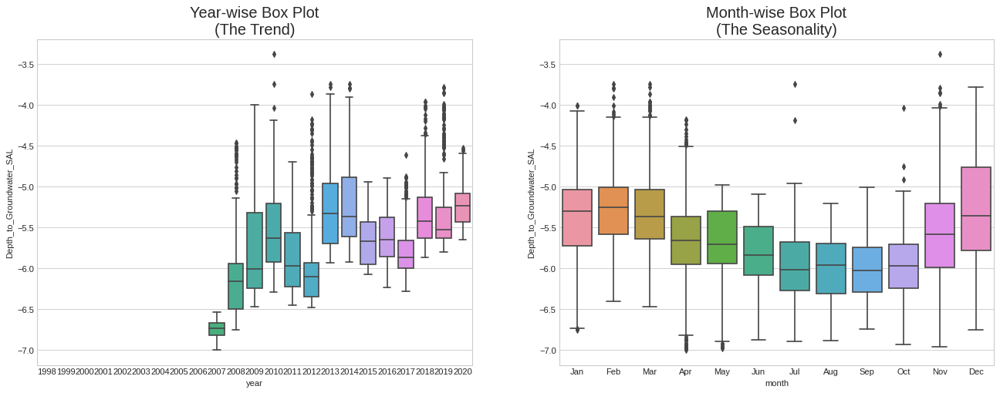

Index(['Date', 'Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri'],
      dtype='object')
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']


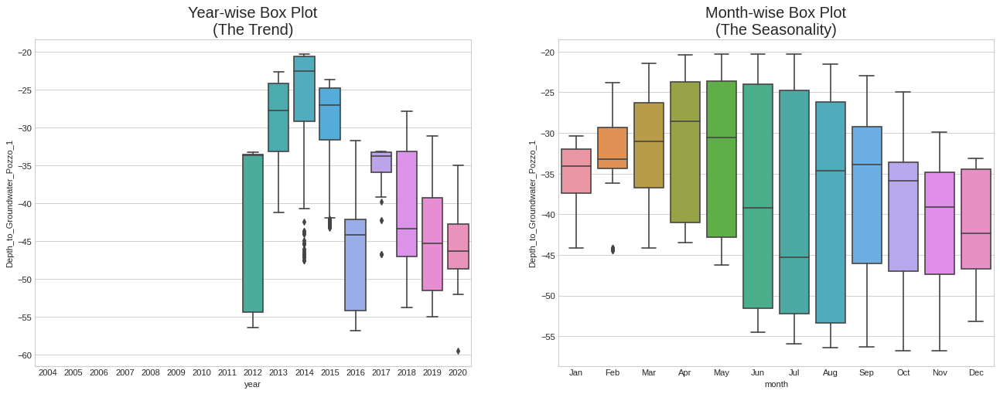

Index(['Date', 'Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4'],
      dtype='object')
['Depth_to_Groundwater_Podere_Casetta']


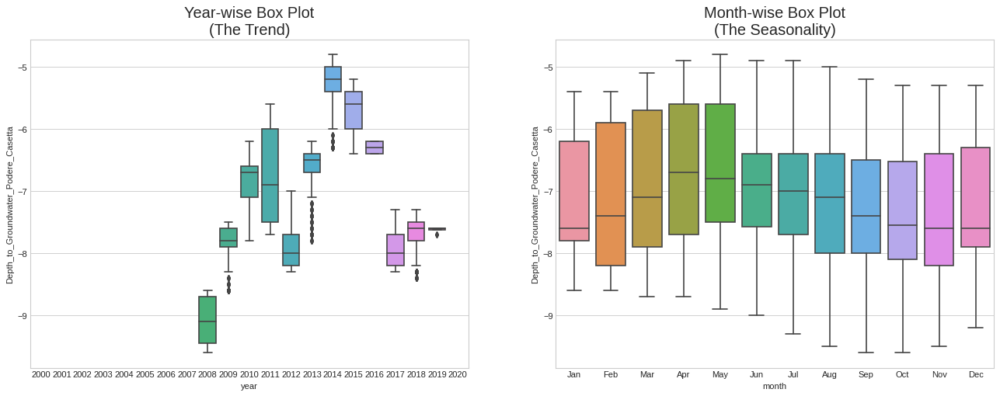

Index(['Date', 'Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano'],
      dtype='object')
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']


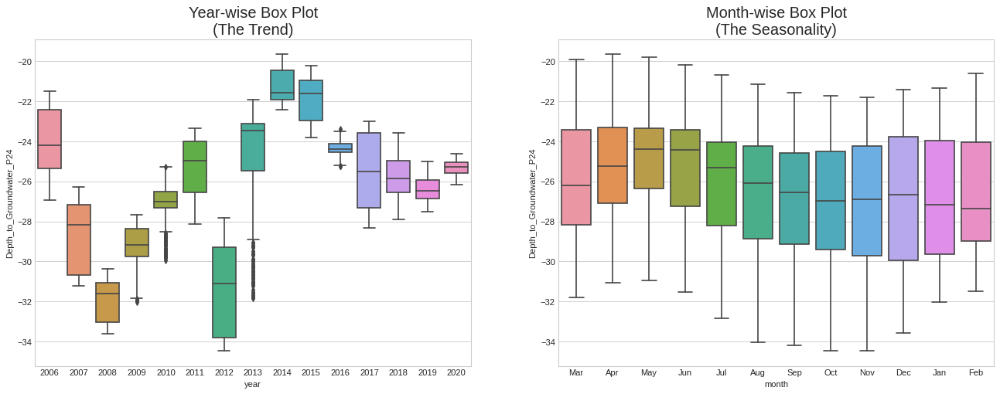

Index(['Date', 'Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate'],
      dtype='object')
['Lake_Level', 'Flow_Rate']


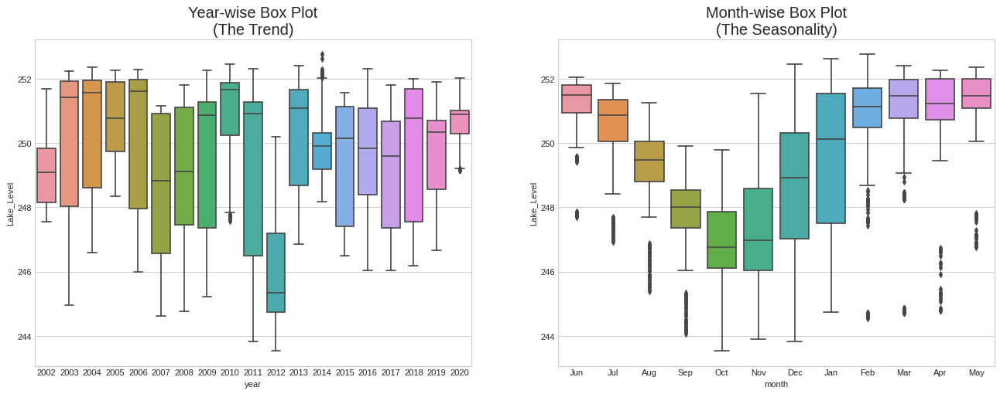

Index(['Date', 'Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano'],
      dtype='object')
['Hydrometry_Nave_di_Rosano']


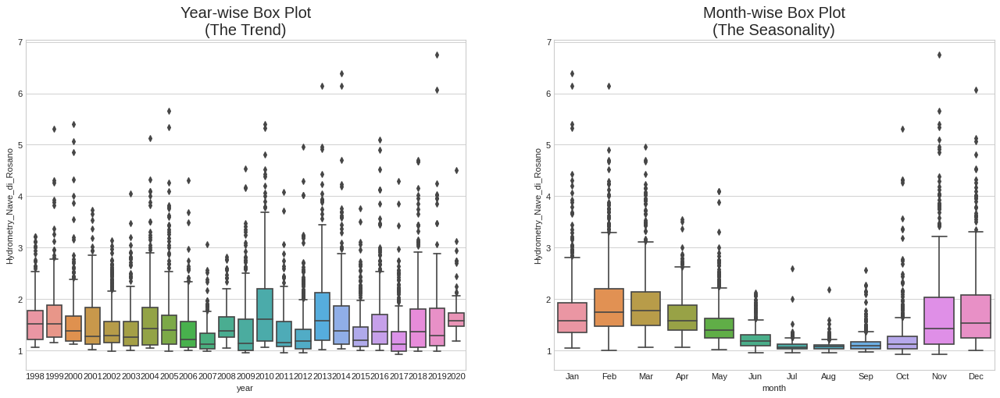

Index(['Date', 'Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta'],
      dtype='object')
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']


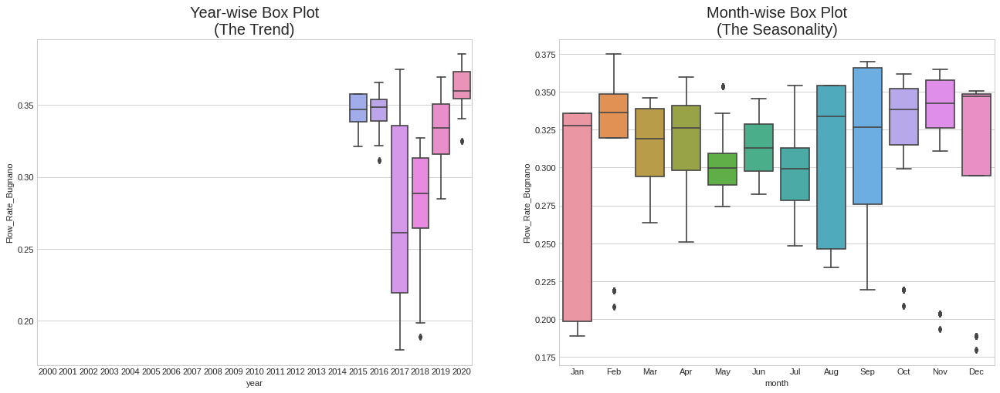

Index(['Date', 'Rainfall_Terni', 'Flow_Rate_Lupa'], dtype='object')
['Flow_Rate_Lupa']


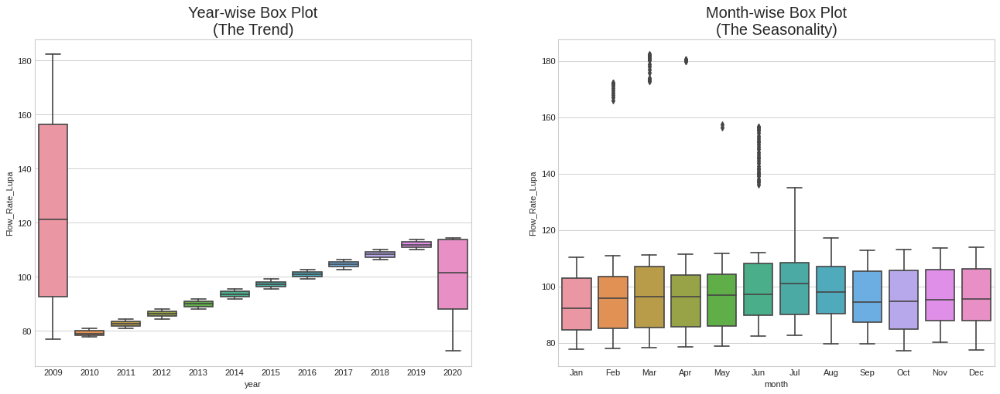

Index(['Date', 'Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto'],
      dtype='object')
['Flow_Rate_Madonna_di_Canneto']


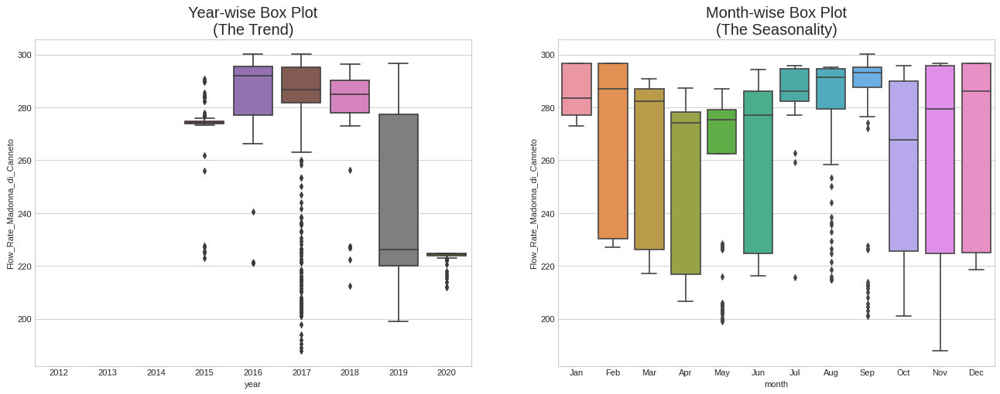

In [ ]:
def box_plot(acea_df,acea_df_target):
  acea_df.replace(0, np.nan, inplace=True)
  acea_df.dropna(subset=['Date'],inplace=True)
  acea_df['year'] = [d.year for d in acea_df.Date]
  acea_df['month'] = [d.strftime('%b') for d in acea_df.Date]
  years = acea_df['year'].unique()
  for target in acea_df_target:
    fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
    sns.boxplot(x='year', y=target, data=acea_df, ax=axes[0])
    sns.boxplot(x='month', y=target, data=acea_df.loc[~acea_df.year.isin([1998, 2020]), :])
    # Set Title
    axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
    plt.show()
    return acea_df

for i,(acea_df,acea_df_target) in enumerate(zip(all_data,all_data_target)):
    print(acea_df.columns)
    print(acea_df_target)
    all_data[i] = box_plot(acea_df,acea_df_target)


In [ ]:
year_to_select =  [2011,2017,2017,2009,2004,2004,2016,2011,2017]

Null values recognition.

Aquifer_Auser


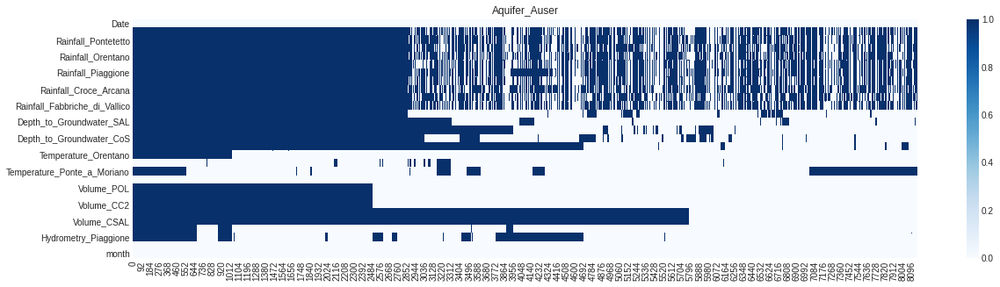

Aquifer_Doganella


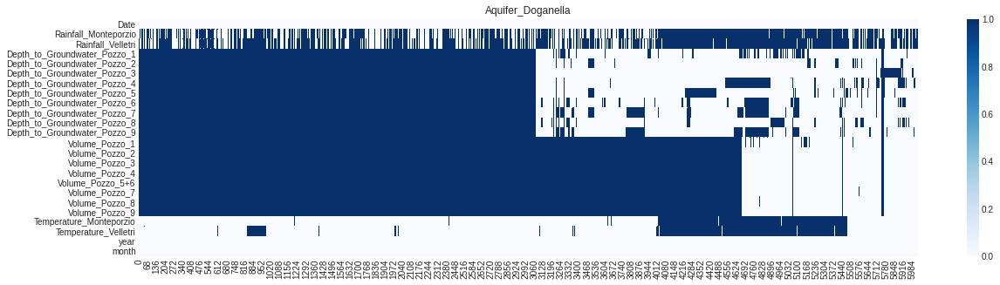

Aquifer_Luco


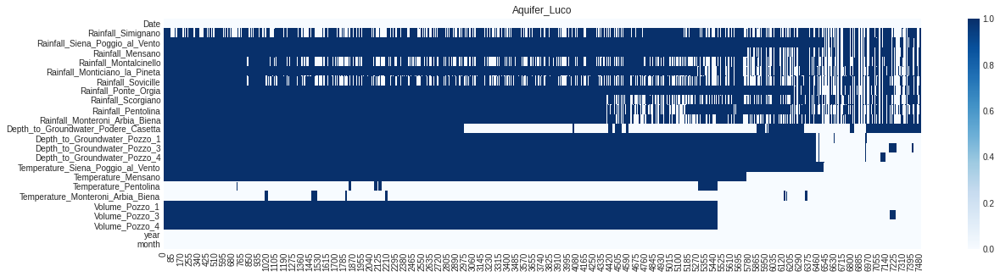

Aquifer_Petrignano


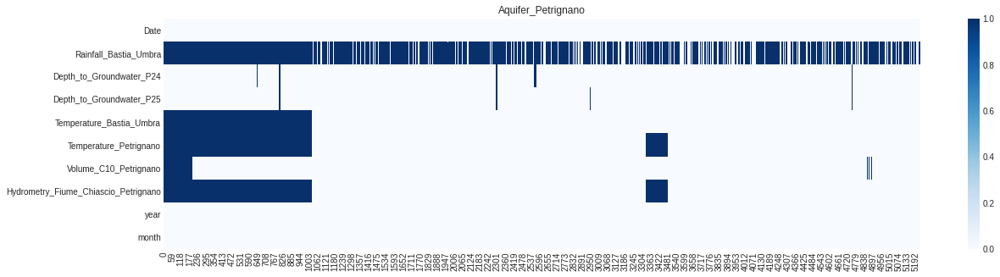

Lake_Bilancino


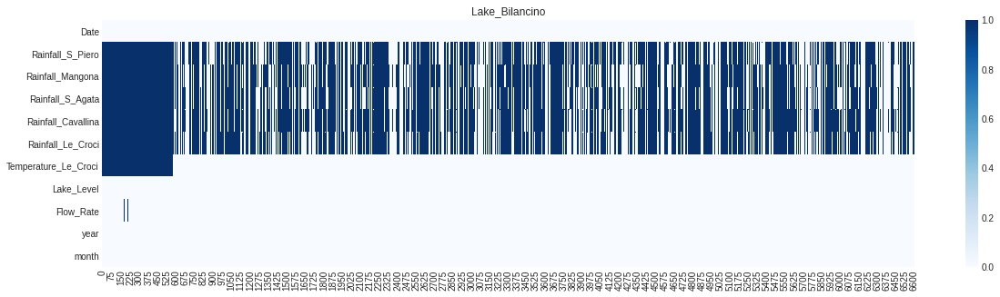

River_Arno


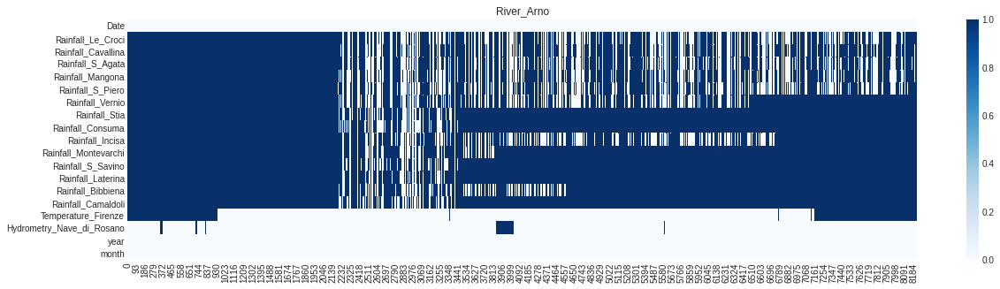

Water_Spring_Amiata


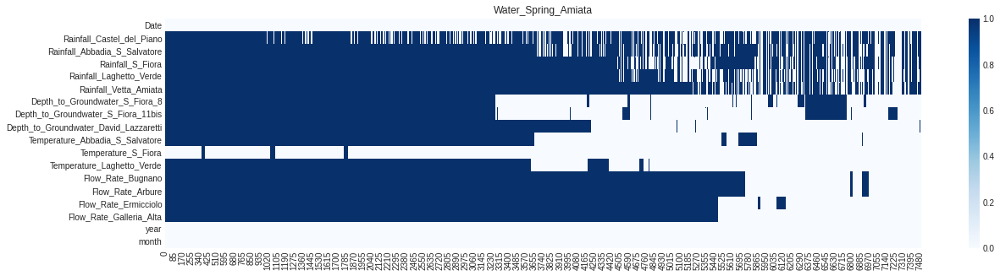

Water_Spring_Lupa


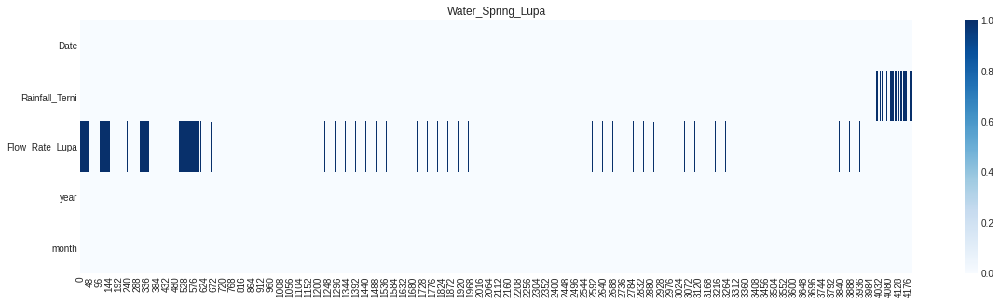

Water_Spring_Madonna_di_Canneto


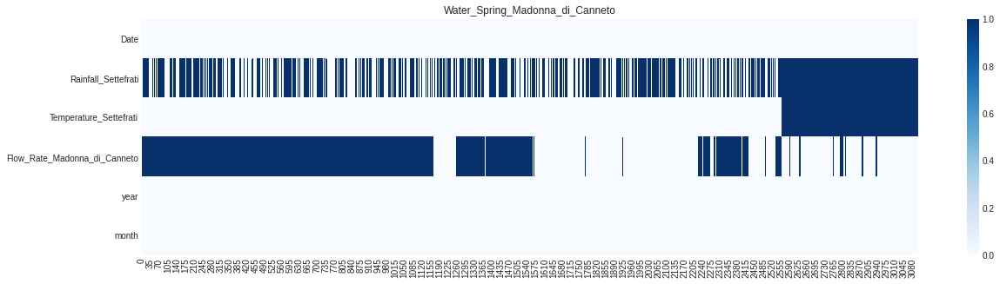

In [ ]:
def nagraph(name,acea_df):
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,5))
    sns.heatmap(acea_df.T.isna(), cmap='Blues')
    ax.set_title(name)
    plt.show()
    
for name,acea_df,acea_df_target in zip(dataset,all_data,all_data_target):
    print(name)
    nagraph(name,acea_df)

## Data Preprocessing

### Feature Selection

In [ ]:
!pip install shap

As a preprocessing step of the data, we will fill the NaN values and replace the implausible values as well. First, the implausible values of 0°C will be replaced with NaN values. Then all NaN values will be filled by prediction. For this, we will build a small prediction model.

We will be using LightGBM with a 5 fold CV. The features are the temperature columns as well as the date features. Although, the mean absolute error is quite high for the below shown example, we can see that the rolling mean for the predicted values is very close to the rolling mean of the ground truth. Although the models performance is not very good, we can evaluate it as sufficient for filling the missing values.

In [ ]:
def data_impute(acea_df,acea_df_target):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_absolute_error
    import lightgbm as lgb

    features_to_fill = acea_df.columns[:-2]
    temp_df = acea_df[features_to_fill].copy()

    # Create time related features
    temp_df['year'] = pd.DatetimeIndex(temp_df['Date']).year 

    temp_df['month'] = pd.DatetimeIndex(temp_df['Date']).month 
    month_in_year = 12
    temp_df['month_sin'] = np.sin(2*np.pi*temp_df.month/month_in_year)
    temp_df['month_cos'] = np.cos(2*np.pi*temp_df.month/month_in_year)

    temp_df['season'] = temp_df.month%12 // 4 + 1

    temp_df['day_of_year'] = pd.DatetimeIndex(temp_df['Date']).dayofyear
    days_in_year = 365.25
    temp_df['day_of_year_sin'] = np.sin(2*np.pi*temp_df.day_of_year/days_in_year)
    temp_df['day_of_year_cos'] = np.cos(2*np.pi*temp_df.day_of_year/days_in_year)

    temp_df['week_of_year'] = pd.DatetimeIndex(temp_df['Date']).weekofyear
    weeks_in_year = 52.1429
    temp_df['week_of_year_sin'] = np.sin(2*np.pi*temp_df.week_of_year/weeks_in_year)
    temp_df['week_of_year_cos'] = np.cos(2*np.pi*temp_df.week_of_year/weeks_in_year)
    
    features = ['month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos', 'week_of_year_sin', 'week_of_year_cos', 'year', 'season']
    temp_df.drop(['month'],axis=1,inplace=True)
    i=1
    plt.figure(figsize=(60,20))
    for attribute in features_to_fill[1:]:
          if attribute in acea_df_target:
            clr = 'black'
          else:
            clr = 'blue'
          target = attribute
          X = temp_df[temp_df[attribute].notna()][features]#.reset_index(drop=True)
          y = temp_df[temp_df[attribute].notna()][target]#.reset_index(drop=True)
          X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.3)

          X_test = temp_df[features]#.reset_index(drop=True)
          # Model
          params = {'num_leaves': 32,
                    'objective': 'regression_l1',
                    'max_depth': 8,
                    'learning_rate': 0.05,
                    "metric": 'mae',
                    'seed' : 42
                  }

          dtrain = lgb.Dataset(X_train, y_train)
          dvalid = lgb.Dataset(X_valid, y_valid)

          clf = lgb.train(params, dtrain, 5000, valid_sets = [dtrain, dvalid], verbose_eval=False,  early_stopping_rounds=100)

          y_pred_valid = clf.predict(X_valid)
          
          old = temp_df[attribute].copy()
          y_pred = clf.predict(X_test)
          #replacing of actual null values here
          acea_df[attribute] = np.where(acea_df[attribute].isna(), y_pred, acea_df[attribute])
          
          plt.subplot(10,3,i)
          sns.scatterplot(x=acea_df.Date, y=acea_df[attribute], color='red',label='predicted')
          sns.scatterplot(x=acea_df.Date, y=old.fillna(np.inf), color=clr, label = 'original')
          i=i+1
    plt.show()

    try:
        acea_df.drop(['Date','month'],axis=1,inplace=True)
    except:
        acea_df.drop(['Date'],axis=1,inplace=True)
    return acea_df

Dataset for imputation - Aquifer_Auser


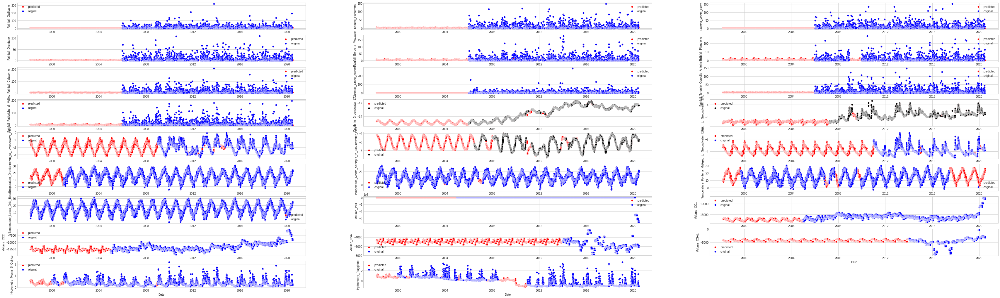

Dataset for imputation - Aquifer_Doganella


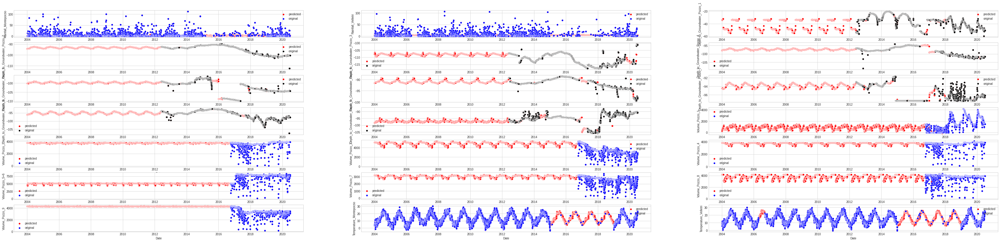

Dataset for imputation - Aquifer_Luco


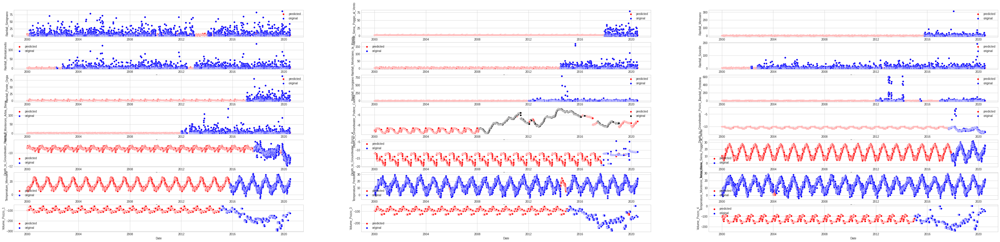

Dataset for imputation - Aquifer_Petrignano


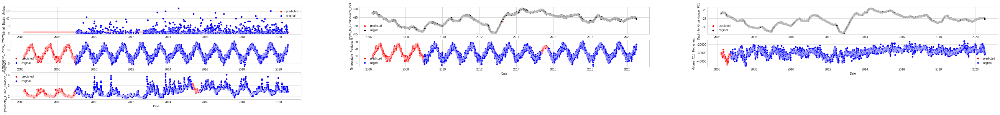

Dataset for imputation - Lake_Bilancino


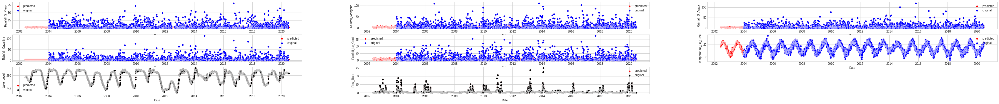

Dataset for imputation - River_Arno


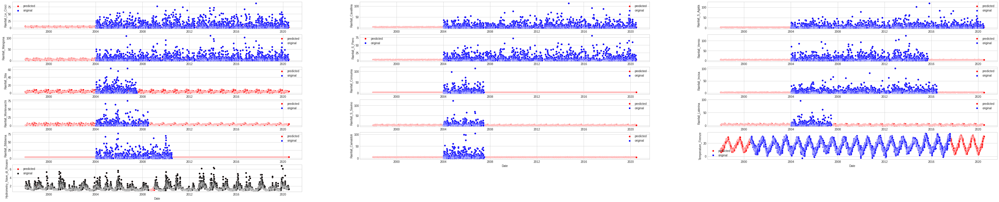

Dataset for imputation - Water_Spring_Amiata


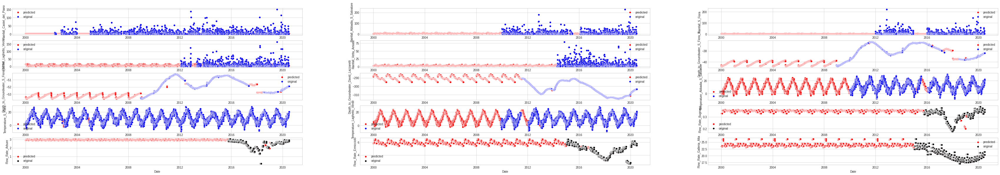

Dataset for imputation - Water_Spring_Lupa


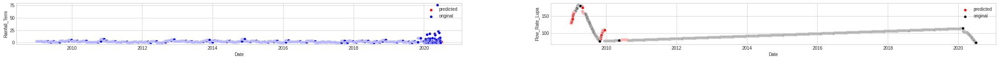

Dataset for imputation - Water_Spring_Madonna_di_Canneto


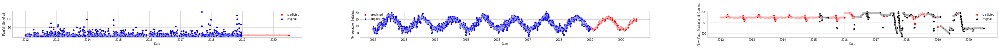

In [ ]:
for i,(name,acea_df,acea_df_target) in enumerate(zip(dataset,all_data,all_data_target)):
    print("Dataset for imputation - " + str(name))
    all_data[i] = data_impute(acea_df,acea_df_target)

In [ ]:
def select_dates(acea_df,year):
    acea_df['year'] = pd.DatetimeIndex(acea_df['Date']).year 
    acea_df = acea_df[acea_df.year>year-1]
    print(acea_df.head())
    return acea_df

for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  all_data[i] = select_dates(acea_df,year)

           Date  Rainfall_Gallicano  ...  year  month
4685 2011-01-01                 NaN  ...  2011    Jan
4686 2011-01-02                 NaN  ...  2011    Jan
4687 2011-01-03                 NaN  ...  2011    Jan
4688 2011-01-04                 0.2  ...  2011    Jan
4689 2011-01-05                 NaN  ...  2011    Jan

[5 rows x 29 columns]
           Date  Rainfall_Monteporzio  ...  year  month
4749 2017-01-01                   NaN  ...  2017    Jan
4750 2017-01-02                   NaN  ...  2017    Jan
4751 2017-01-03                  12.0  ...  2017    Jan
4752 2017-01-04                   NaN  ...  2017    Jan
4753 2017-01-05                   NaN  ...  2017    Jan

[5 rows x 24 columns]
           Date  Rainfall_Simignano  ...  year  month
6210 2017-01-01                 NaN  ...  2017    Jan
6211 2017-01-02                 3.4  ...  2017    Jan
6212 2017-01-03                14.0  ...  2017    Jan
6213 2017-01-04                 2.8  ...  2017    Jan
6214 2017-01-05         

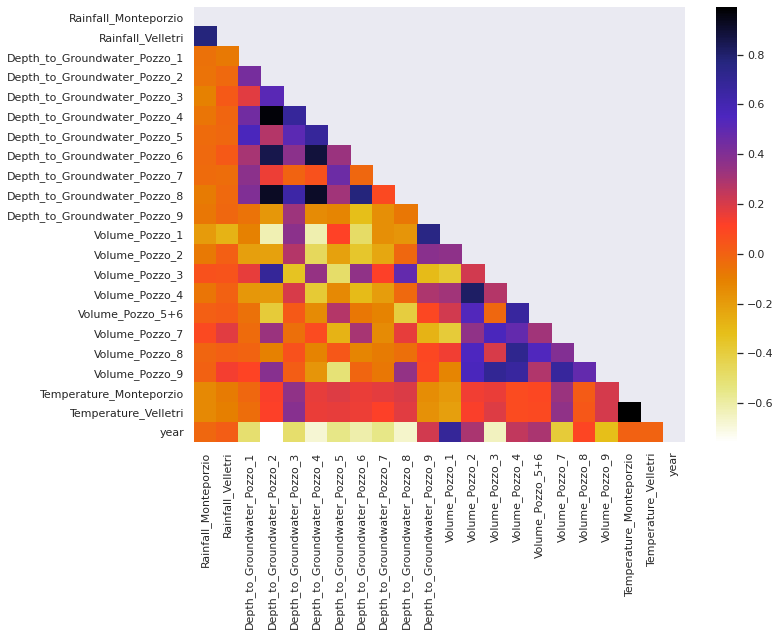

In [ ]:
num_feat = [x for x in Aquifer_Doganella.columns if Aquifer_Doganella[x].dtype !="object"]
mask = np.triu(np.ones_like(Aquifer_Doganella[num_feat].corr(), dtype = bool))
sns.set(rc={'figure.figsize':(11,8)})
sns.heatmap(Aquifer_Doganella[num_feat].corr(),mask=mask, fmt='', cmap='CMRmap_r')

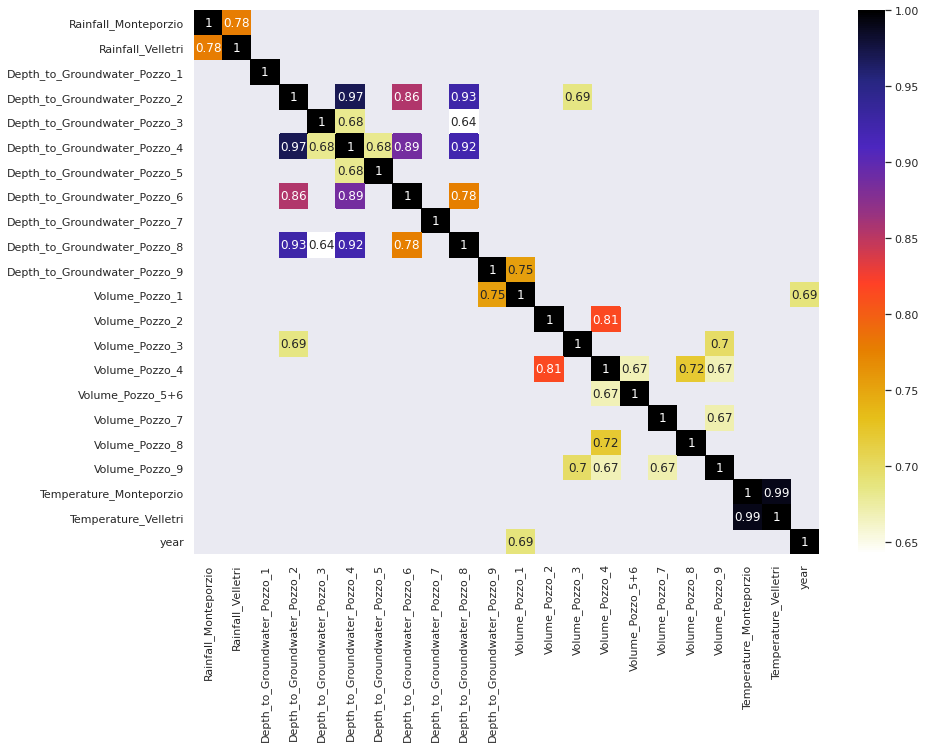

In [ ]:
# Correlated variables greater than 0.8
num_feat = [x for x in Aquifer_Doganella.columns if Aquifer_Doganella[x].dtype !="object"]
mask = np.triu(np.ones_like(Aquifer_Doganella[num_feat].corr(), dtype = bool))
plt.figure(figsize=(14,10))
sns.heatmap(Aquifer_Doganella[num_feat].corr().T, annot=True, mask= Aquifer_Doganella[num_feat].corr() < 0.6 , cmap='CMRmap_r');

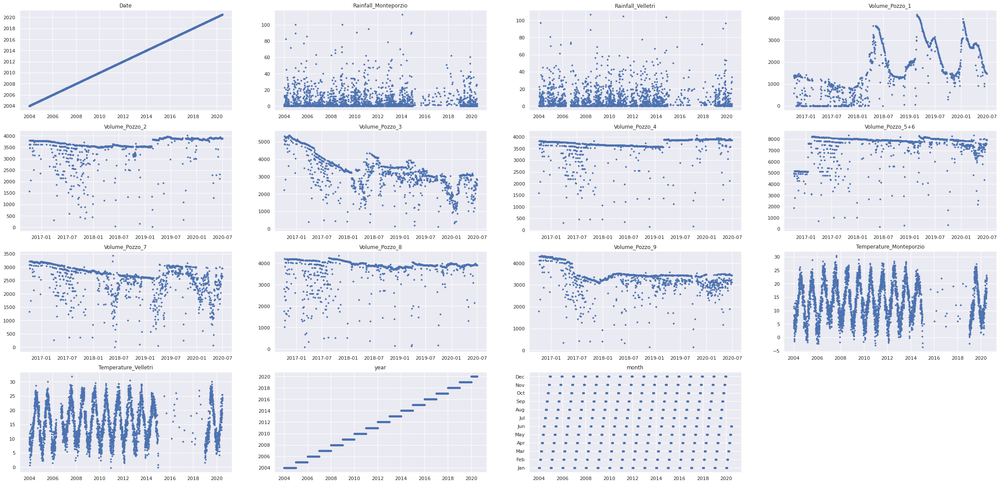

In [ ]:
plt.figure(figsize=(40,60))
i=0
for col in Aquifer_Doganella.columns:
  if col not in Aquifer_Doganella_target:
      plt.subplot(12,4, i+1)
      plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella[col],'b.')
      plt.title(col)
      i=i+1
plt.show()

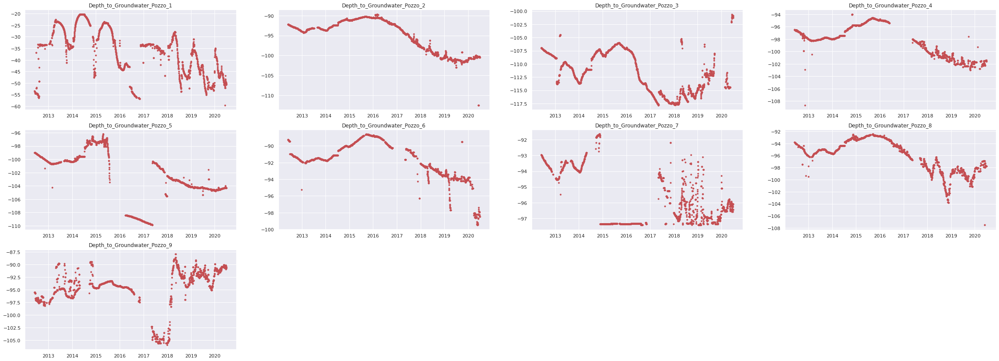

In [ ]:
plt.figure(figsize=(40,60))
for i,col in enumerate(Aquifer_Doganella_target):
  plt.subplot(12,4, i+1)
  plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella[col],'r.')
  plt.title(col)
plt.show()

In [ ]:
len(all_data)

9

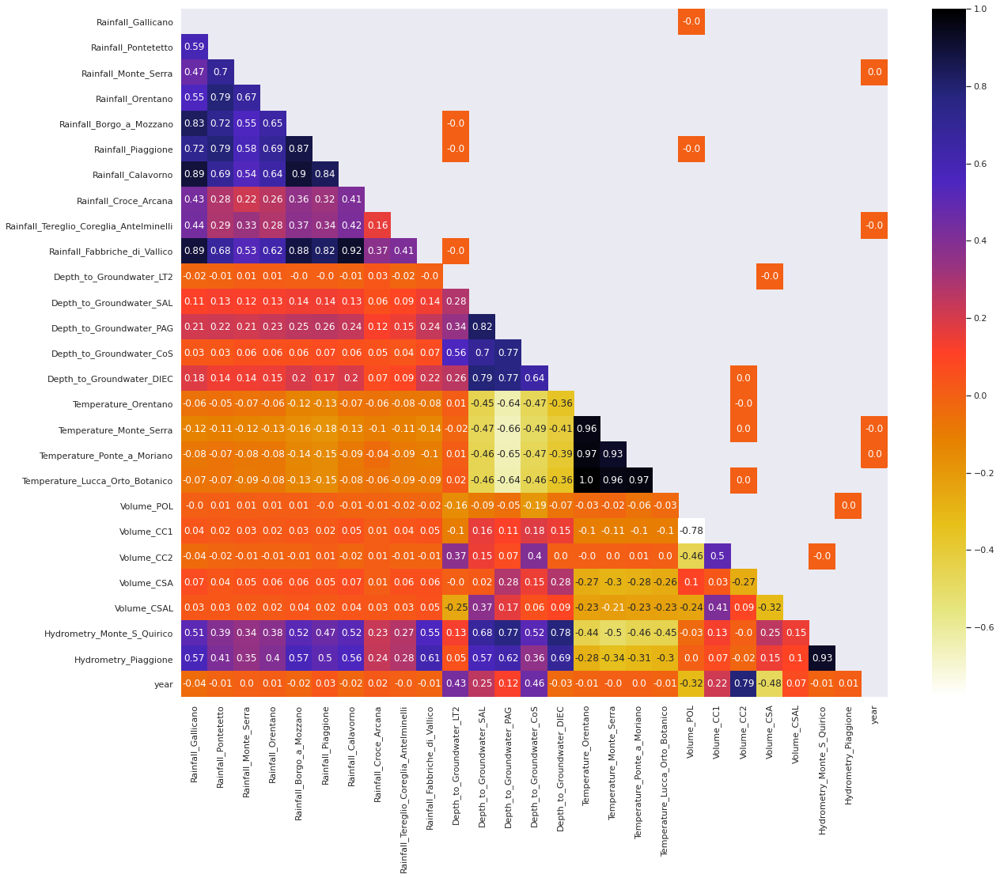

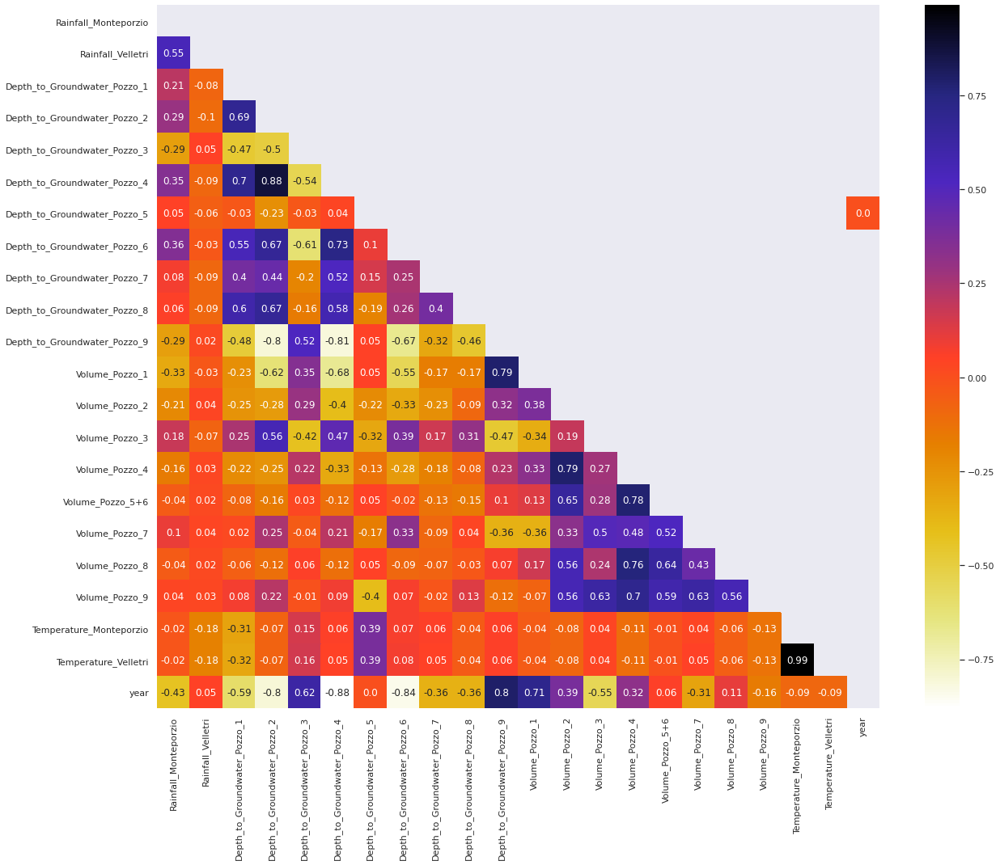

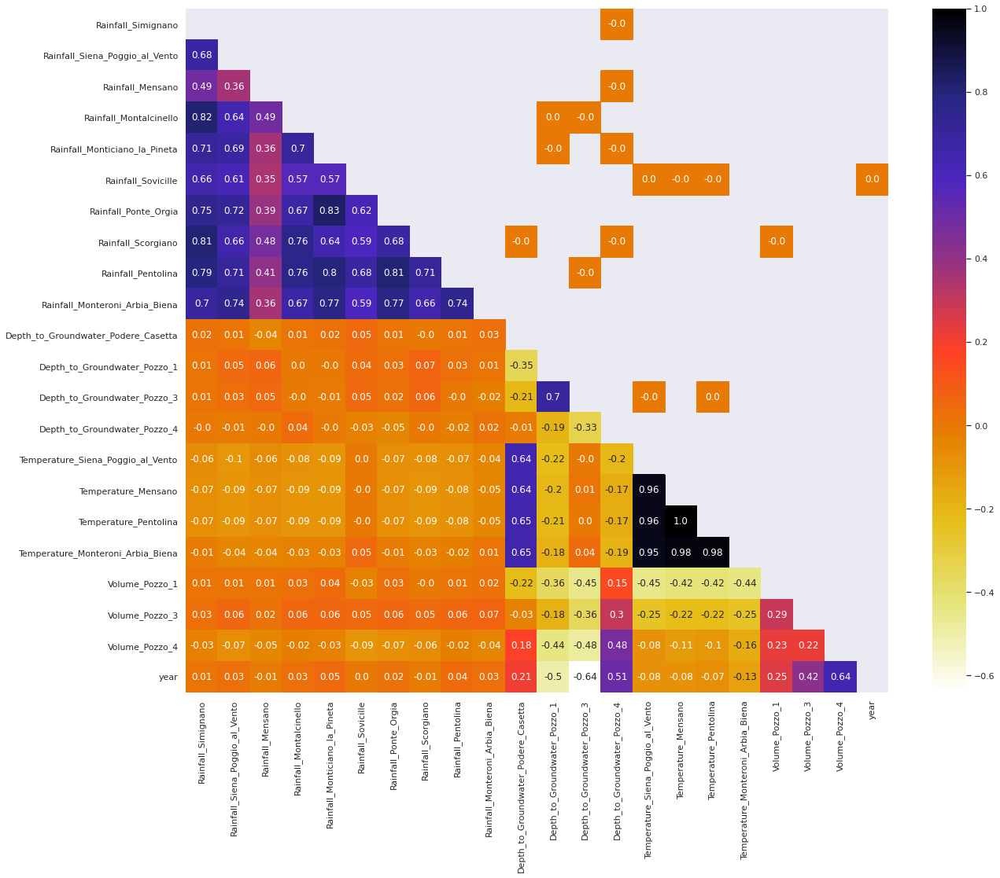

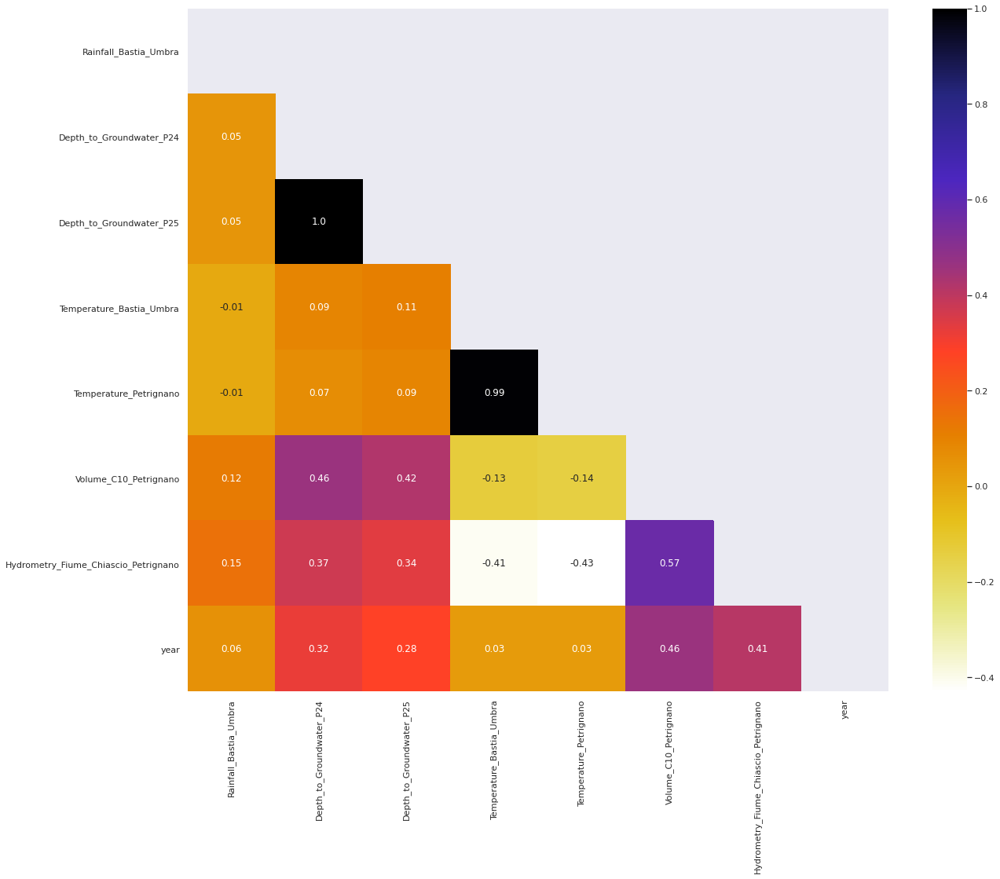

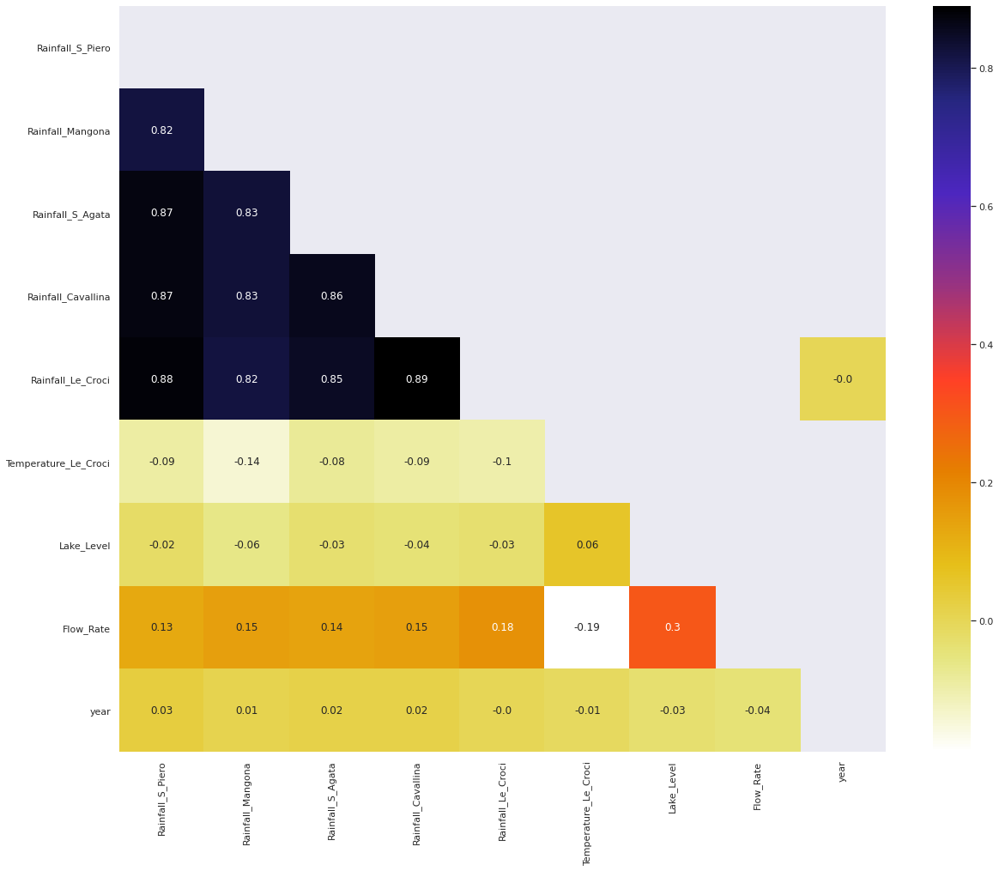

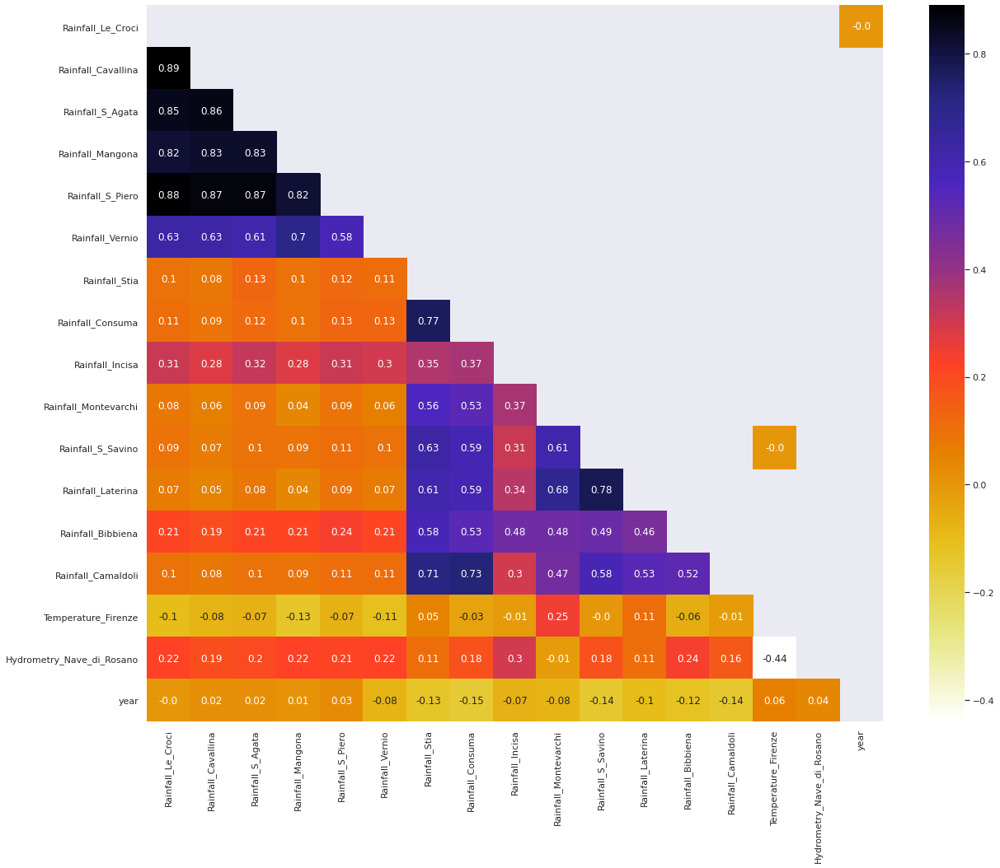

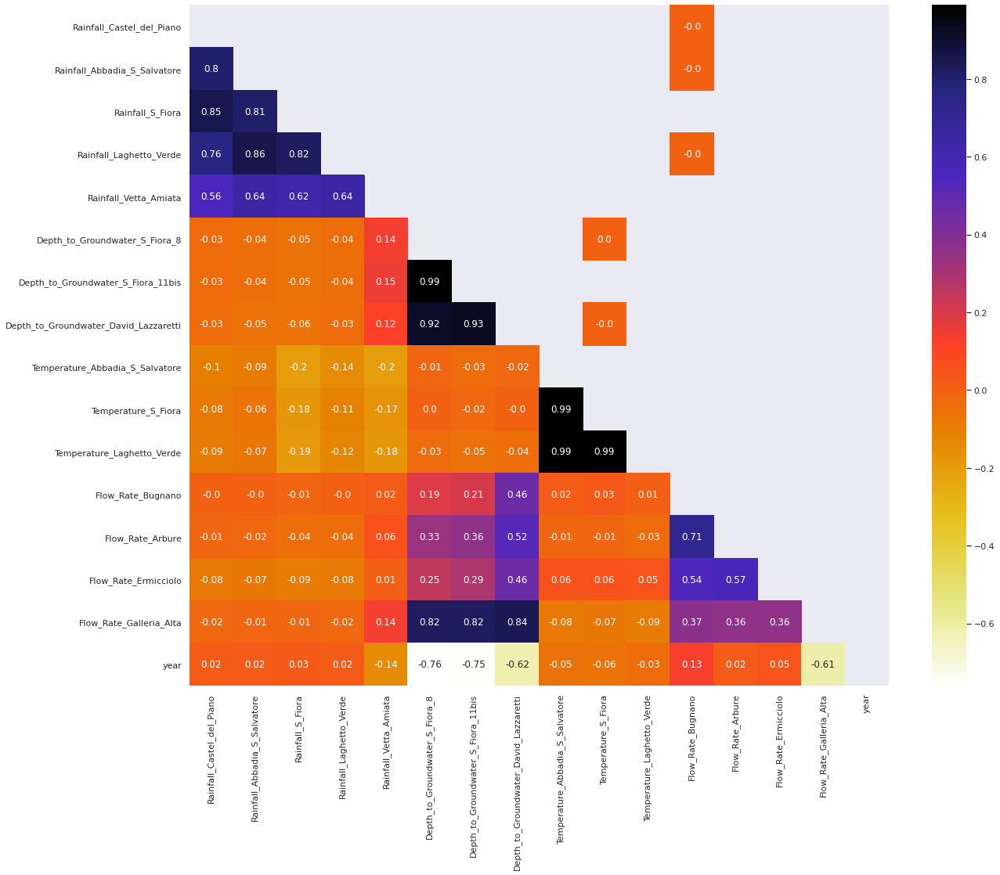

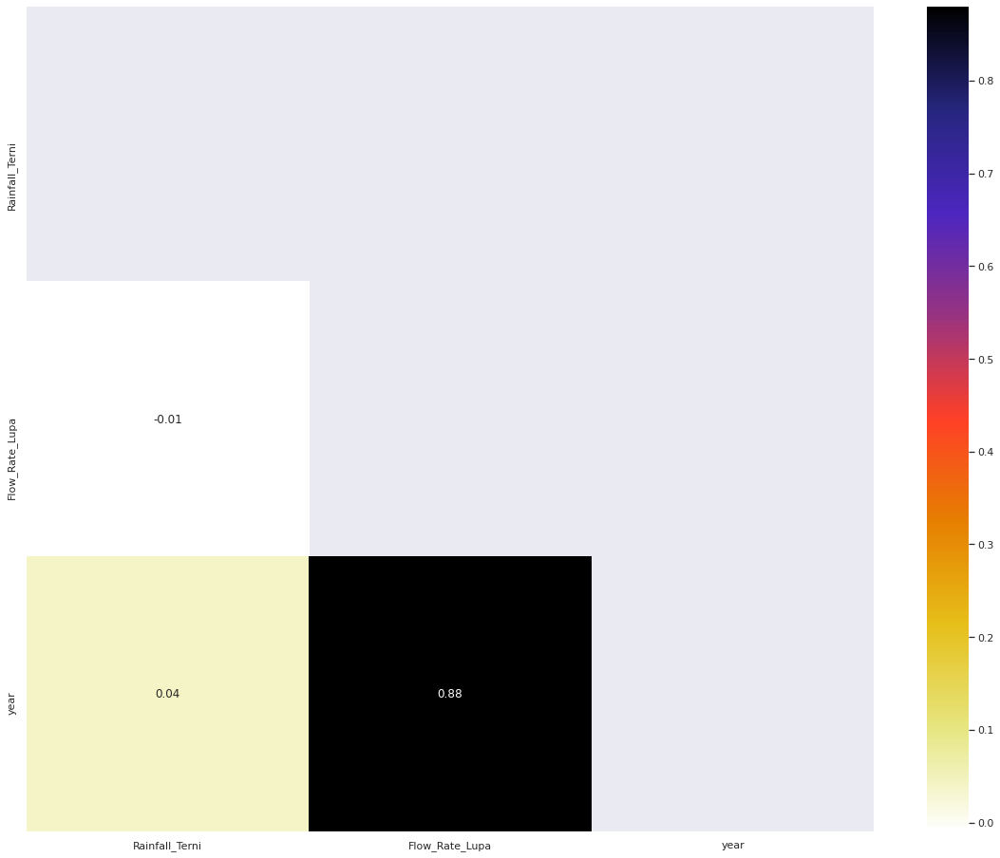

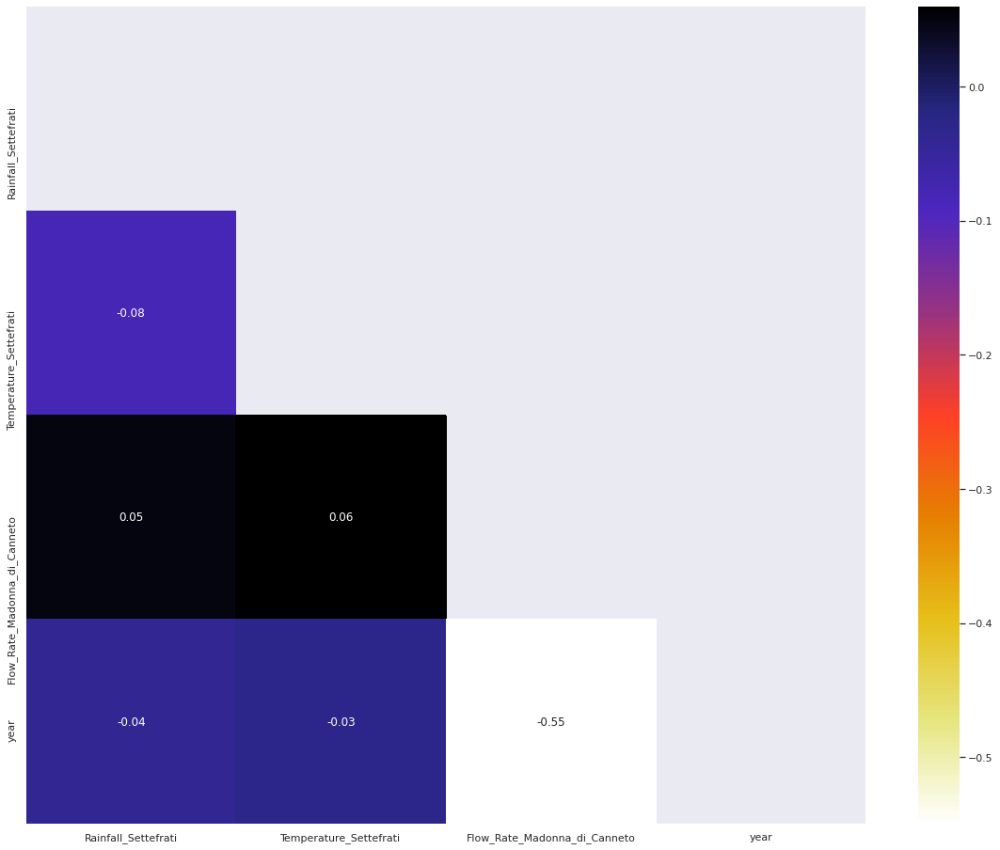

In [ ]:
for i in range(len(all_data)):
  num_feat = [x for x in all_data[i].columns if all_data[i][x].dtype !="object"]
  corr = all_data[i][num_feat].corr()
  corr = round(corr, 2)
  corr.style.background_gradient(cmap='coolwarm').set_precision(2)
  mask = np.triu(corr)
  sns.set(rc={'figure.figsize':(20,16)})
  sns.heatmap(corr,mask=mask, fmt='',annot=True, cmap='CMRmap_r')
  plt.show()

###Stationarity test
(Nans and inf not allowed)
more negative the value the more likely we are to reject null hypothesis(stationary)

Augmented Dickey-Fuller (ADF) test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

Null Hypothesis (H0): Time series has a unit root. (Time series is not stationary).

Alternate Hypothesis (H1): Time series has no unit root (Time series is stationary).

If the null hypothesis can be rejected, we can conclude that the time series is stationary.

There are two ways to rejects the null hypothesis:

On the one hand, the null hypothesis can be rejected if the p-value is below a set significance level. The defaults significance level is 5%

**p-value > significance level (default: 0.05)**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**p-value <= significance level (default: 0.05)**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.
On the other hand, the null hypothesis can be rejects if the test statistic is less than the critical value.

**ADF statistic > critical value**: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
**ADF statistic < critical value**: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

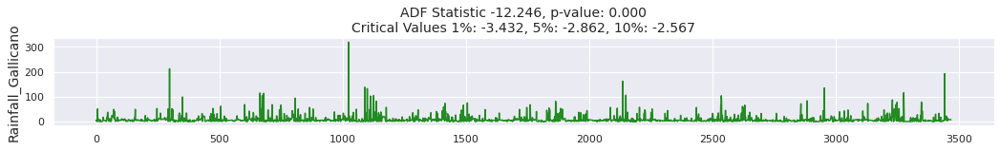

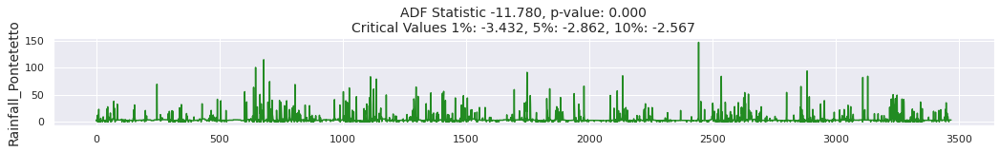

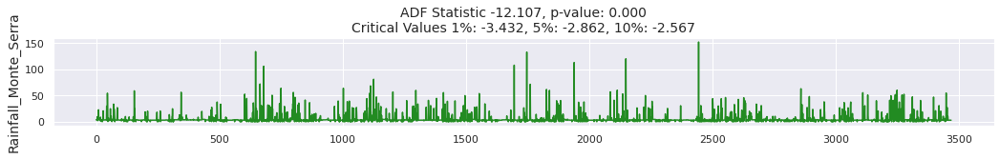

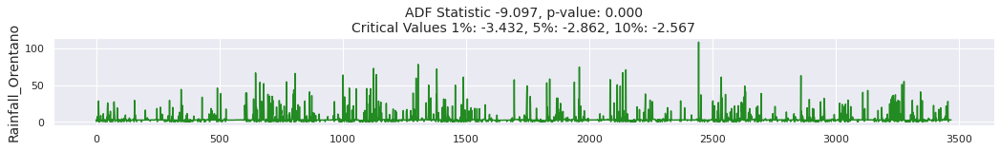

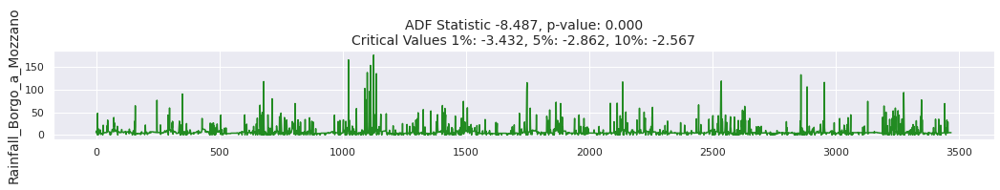

...

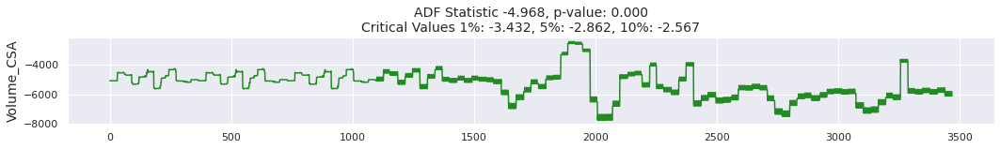

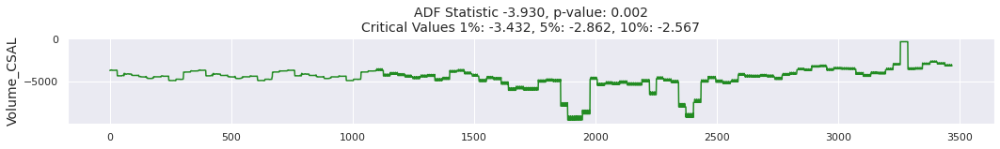

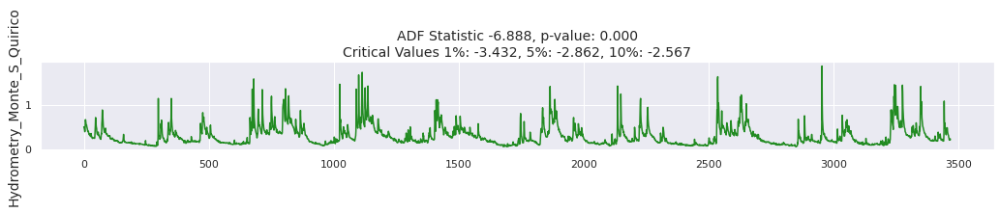

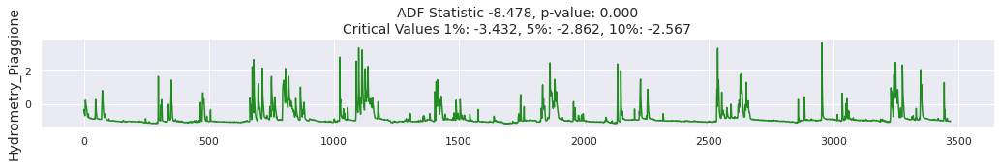

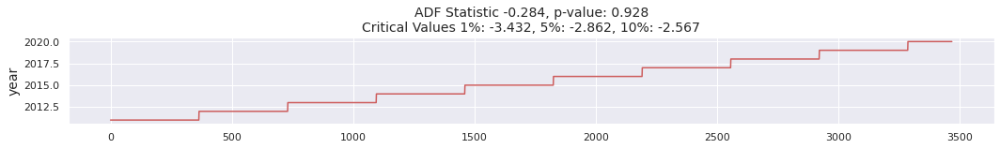

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[0].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[0][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

### Stationarity Test

In [ ]:
"""for i,(acea_df,acea_df_target) in enumerate(zip(all_data,all_data_target)):
    X = acea_df.values
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
      print('\t%s: %.3f' % (key, value))"""

"for i,(acea_df,acea_df_target) in enumerate(zip(all_data,all_data_target)):\n    X = acea_df.values\n    result = adfuller(X)\n    print('ADF Statistic: %f' % result[0])\n    print('p-value: %f' % result[1])\n    print('Critical Values:')\n    for key, value in result[4].items():\n      print('\t%s: %.3f' % (key, value))"

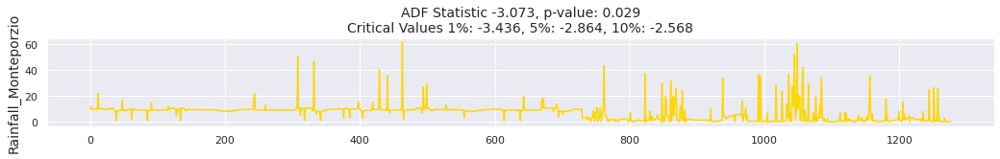

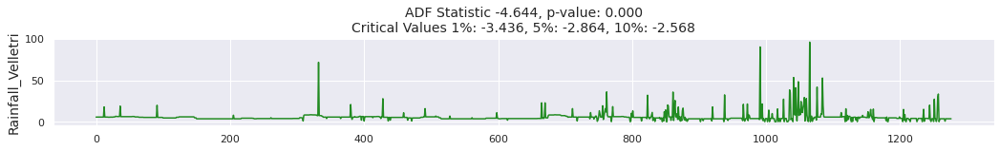

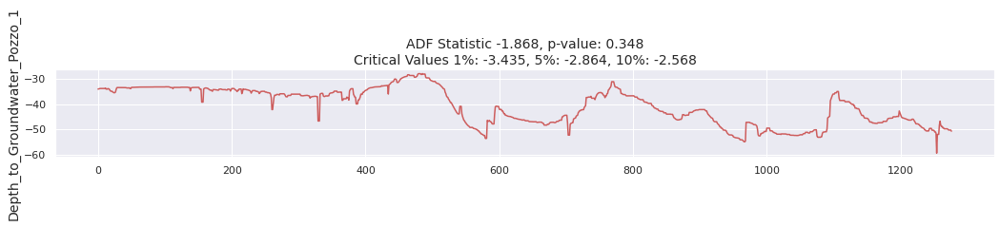

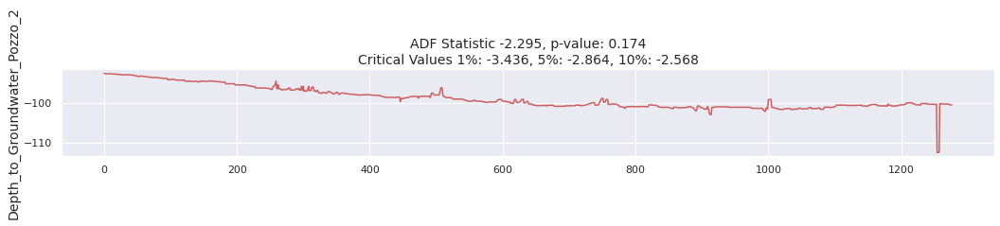

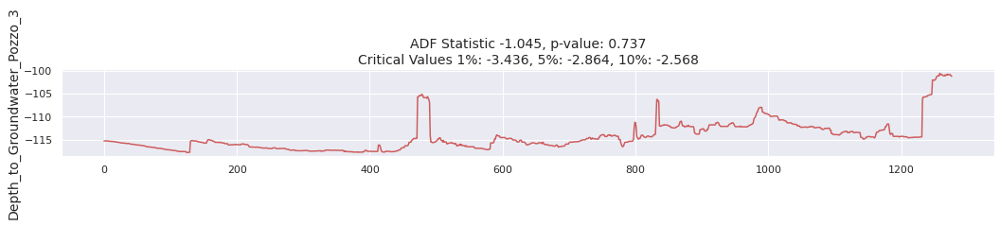

...

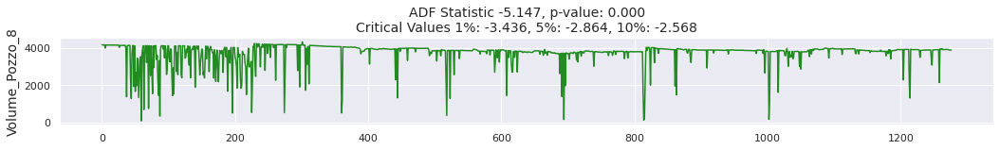

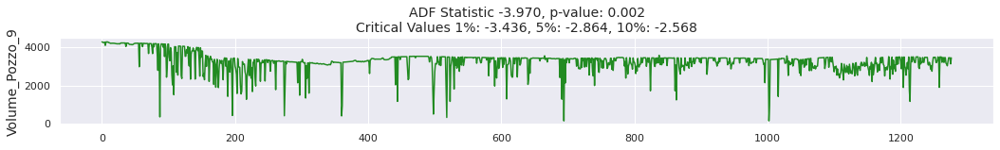

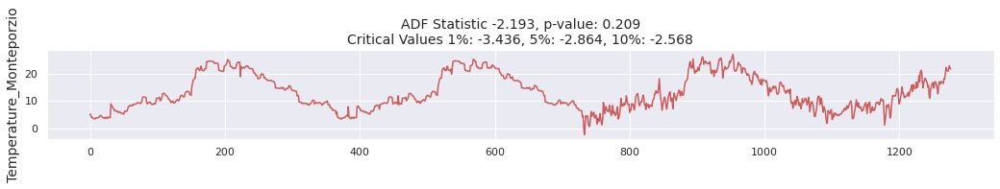

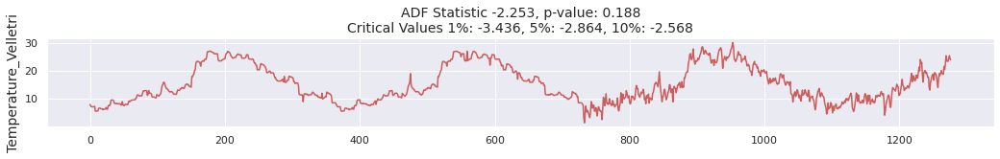

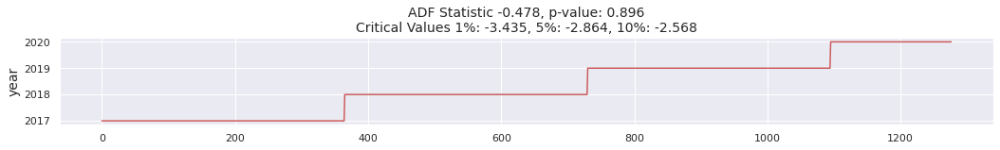

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[1].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[1][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
plt.show()

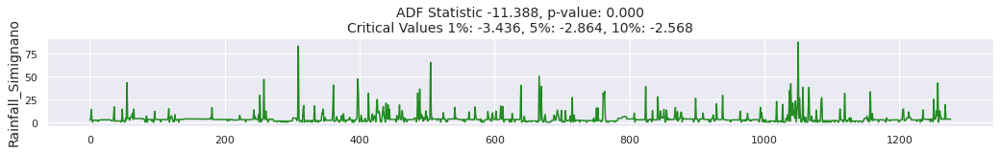

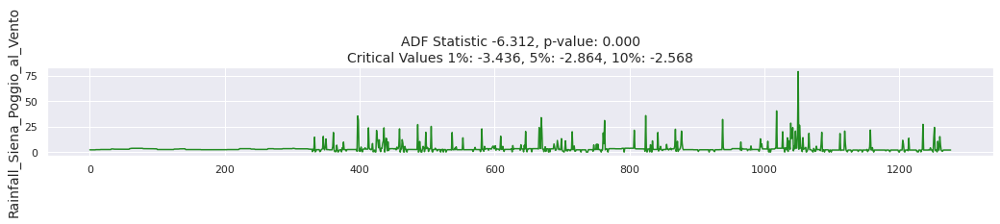

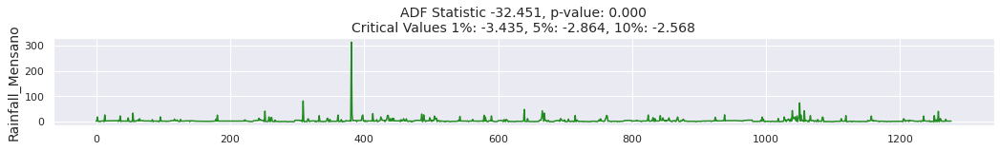

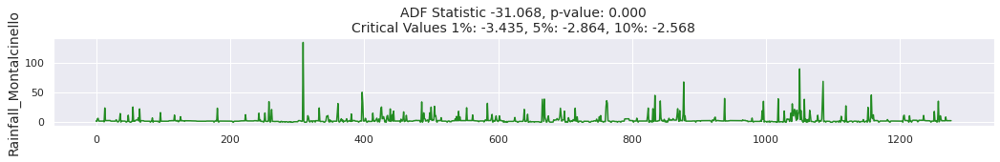

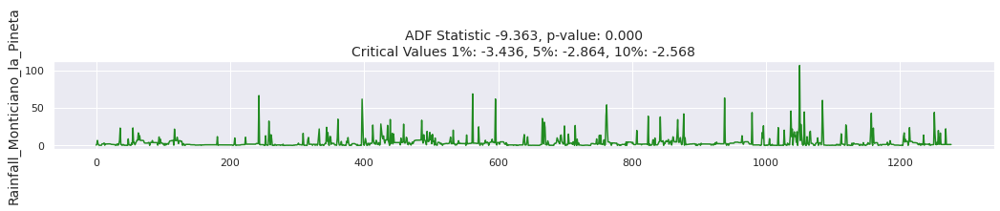

...

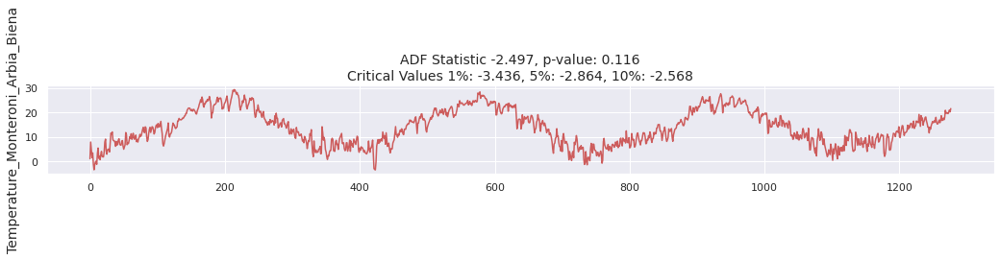

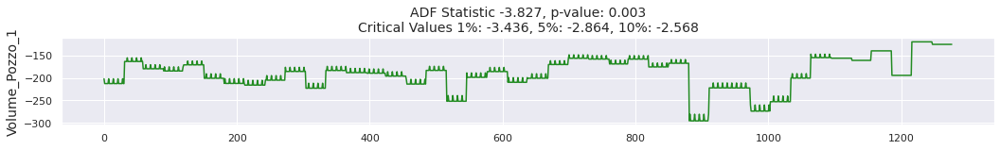

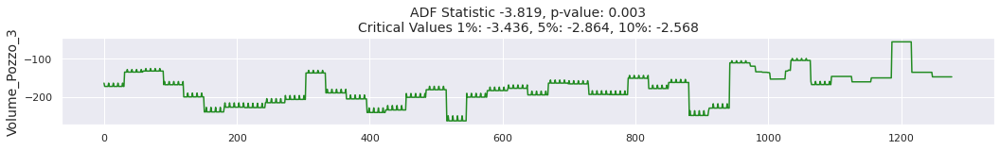

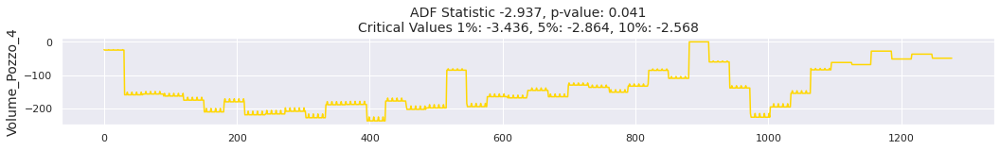

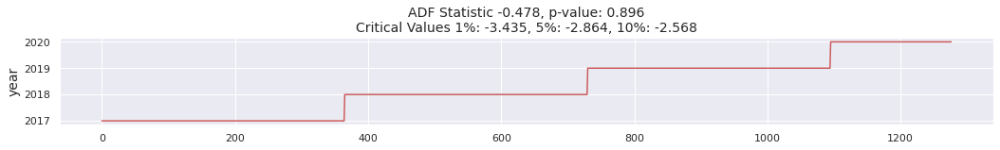

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[2].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[2][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

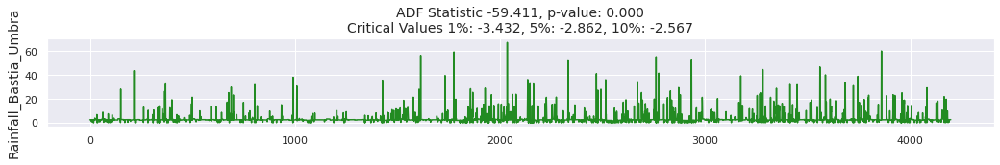

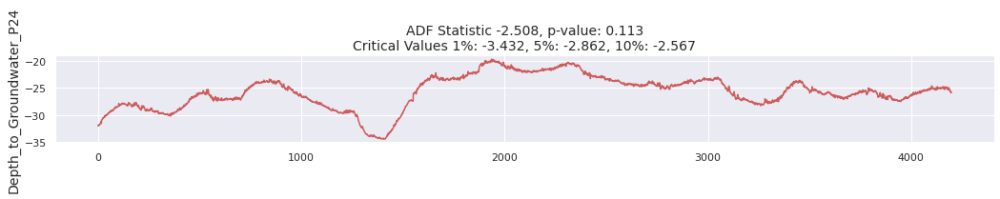

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[3].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[3][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[4].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[4][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[5].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[5][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[5].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[5][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[6].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[6][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[7].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[7][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

In [ ]:
from statsmodels.tsa.stattools import adfuller

for i,col in enumerate(all_data[8].columns):
    plt.figure(figsize=(60,20))
    if col=='Date':
      continue
    series = all_data[8][col].values
    i=1
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'

    plt.subplot(10,3,i)
    plt.plot(series, color=linecolor)
    i=i+1
    plt.title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    plt.ylabel(ylabel=str(col), fontsize=14)
    plt.show()

# LSTM

# Models

In [ ]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import shap

In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [ ]:
def get_model(trainX):
        model = Sequential()
        model.add(LSTM(100, activation='relu',return_sequences=True, input_shape=(trainX.shape[1], trainX.shape[2])))
        model.add(Dropout(0.4))
        model.add(LSTM(50, activation='relu',return_sequences=True))
        model.add(Dropout(0.3))
        model.add(LSTM(30, activation='relu'))
        model.add(Dropout(0.4))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

In [ ]:
def forecast(name,acea_df,acea_df_target):
    dataset = acea_df.copy()
    values = dataset.values
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    cols_to_drop = [len(acea_df.columns) + acea_df.columns.get_loc(c) for c in acea_df if c not in acea_df_target]
    reframed.drop(reframed.columns[cols_to_drop], axis=1, inplace=True)
    values = reframed.values

    train_size = int(len(values) * 0.7)
    test_size = len(values) - train_size

    train, test = values[0:train_size,:], values[train_size:len(values),:]
    scale = MinMaxScaler(feature_range=(0, 1))
    scale.min_,scale.scale_ = scaler.min_[0],scaler.scale_[0]

    for i in range(1,len(acea_df.columns)-len(cols_to_drop)+1):
        trainX, trainY = train[:, :len(acea_df.columns)], train[:, -i]
        testX, testY = test[:, :len(acea_df.columns)], test[:, -i]

        trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
        testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))

        """        model = get_model(trainX)
        grads = gradient_importance(trainX, model)
        print('Mean:', np.mean(grads))
        print('Standard Deviation:', np.std(grads))
        plt.figure(figsize=(10,8))
        plt.bar(acea_df.columns,grads)
        plt.xticks(acea_df.columns, rotation=90)
        plt.show()
        #|
        idx = np.nonzero((abs(grads) > 0.04))
        print("Selected Features - " + str(idx))

        foo = trainX[:,:,idx]
        trainX = np.squeeze(foo, axis=(1,))
        foo = testX[:,:,idx]
        testX = np.squeeze(foo, axis=(1,))
        """
        model = get_model(trainX)
        history = model.fit(trainX, trainY, epochs=100, batch_size=64, validation_data=(testX, testY), verbose=0, shuffle=False)

        yhat = model.predict(testX)
        testX = testX.reshape((testX.shape[0], testX.shape[2]))

        inv_yhat = np.concatenate((yhat, testX[:, 1:]), axis=1)
        inv_yhat = scale.inverse_transform(inv_yhat)
        inv_yhat = inv_yhat[:,0]

        testY = testY.reshape((len(testY), 1))
        inv_y = np.concatenate((testY, testX[:, 1:]), axis=1)
        inv_y = scale.inverse_transform(inv_y)
        inv_y = inv_y[:,0]

        rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
        print('Test RMSE: %.3f' % rmse)
        plt.figure(figsize=(8,5))
        plt.plot(inv_yhat,label='Predicted')
        plt.plot(inv_y,label='Actual')
        plt.title(acea_df_target[i-1])
        plt.legend()
        plt.show()
        plt.figure(figsize=(8,5))
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='test')
        plt.legend()
        plt.show()
        actual.append(inv_y)
        predicted.append(inv_yhat)
        targets.append(acea_df_target[i-1])
    return actual,predicted,targets,history

In [ ]:
def gradient_importance(seq, model):
    seq = tf.Variable(seq, dtype=tf.float32)
    with tf.GradientTape() as tape:
        predictions = model(seq)
    grads = tape.gradient(predictions, seq)
    grads = tf.reduce_mean(grads, axis=1).numpy()[0]
    return grads

In [ ]:
"""acea_df = data_impute(Water_Spring_Lupa)
forecast(acea_df,Water_Spring_Lupa_target)"""

In [ ]:
actual = []
predicted = []
targets = []
for name,acea_df,acea_df_target in zip(dataset,all_data,all_data_target):
  actual,predicted,targets,history = forecast(name,acea_df,acea_df_target)

In [ ]:
plt.figure(figsize=(40,100))
for i,(act,pred,name) in enumerate(zip(actual,predicted,targets)):
  plt.subplot(10,3,i+1)
  plt.plot(act,label='Actual')
  plt.plot(pred,label='Predicted')
  plt.title(name)
  plt.legend()
plt.show()

## XGBOOST

In [ ]:
# Aquifer_Doganella.columns

In [ ]:
# import xgboost as xgb
# from sklearn.model_selection import KFold, train_test_split, GridSearchCV

# # define model
# model = xgb.XGBRegressor()


In [ ]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error

# print("Parameter optimization")
# xgb_model = xgb.XGBRegressor(n_jobs=1)
# clf = GridSearchCV(xgb_model,scoring = 'neg_mean_absolute_error',
#                    param_grid = {'max_depth': [2, 4, 6],
#                     'n_estimators': [50, 100, 200]}, verbose=1, n_jobs=1)
# clf.fit(X.values, y.values)
# print(clf.best_score_)
# print(clf.best_params_)
# param = clf.best_params_

In [ ]:
# xgb_model = xgb.XGBRegressor(max_depth=4,n_estimators=50).fit(X_train.values, y_train.values)
# predictions = xgb_model.predict(X_test.values)
# actuals = y_test.values
# print('MSE: ')
# print(mean_squared_error(actuals, predictions))
# print('MAE: ')
# print(mean_absolute_error(actuals,predictions))
    
# xgb.plot_importance(xgb_model) 

In [ ]:
# plt.plot(actuals)
# plt.plot(predictions)

## ARIMA

In [ ]:
"""!pip install chart_studio
import chart_studio.plotly as ply
import cufflinks as cf

!pip install pmdarima
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from math import sqrt

from pandas import datetime
from sklearn.metrics import mean_squared_error"""

In [ ]:
"""fig, axes = plt.subplots(3, 2, sharex=True)

axes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); 
axes[0, 0].set_title('Original Series')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])

plt.show()"""

In [ ]:
"""def evaluate_arima_model(X, arima_order):
	# prepare training dataset
	train_size = int(len(X) * 0.66)
	train, test = X[0:train_size], X[train_size:]
	history = [x for x in train]
	# make predictions
	predictions = list()
	for t in range(len(test)):
		model = ARIMA(history, order=arima_order)
		model_fit = model.fit()
		yhat = model_fit.forecast()[0]
		predictions.append(yhat)
		history.append(test[t])
	# calculate out of sample error
	rmse = sqrt(mean_squared_error(test, predictions))
	return rmse
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for d in d_values:
			for q in q_values:
				order = (p,d,q)
				try:
					rmse = evaluate_arima_model(dataset, order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					print('ARIMA%s RMSE=%.3f' % (order,rmse))
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
 
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(df.values, p_values, d_values, q_values)"""

In [ ]:
"""model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,
                          test='adf',  # use adftest to find optimal 'd'
                          max_p=5, max_q=5,  # maximum p and q
                          m=4,  # frequency of series
                          d=None,  # let model determine 'd'
                          seasonal=True,  # No Seasonality
                          start_P=0,
                          D=0,
                          trace=True,
                          error_action='ignore',
                          suppress_warnings=True)"""

In [ ]:
"""stepwise_model.summary()
stepwise_model.fit(train).fit(train)
pred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)
pred.columns = ['pred']
pred
plt.plot(train,label="train")
plt.plot(test,label="test")
plt.plot(pred,label="pred")"""